In [1]:
from groundino_samnet.gsam_combined import GSamNetwork
from DataSets.getdata import thermal_feet_dataset, ToBoolTensor, PermuteTensor
from Metrics.Metrics import Metrics 
from torchvision.transforms import transforms
import torch
import matplotlib.pyplot as plt
from groundino_samnet.visuals import plot_grid, plot_image, show_box,show_mask
import numpy as np

c:\Users\WilhelmB\miniconda3\envs\DiagAI2\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
transform_mask = transforms.Compose([
    ToBoolTensor(),
    PermuteTensor((1,2,0)) # (WxHxC)
])
transform_img = transforms.Compose([
    transforms.ToTensor(),
    transforms.ConvertImageDtype(torch.uint8),
    PermuteTensor((1,2,0)) #(WxHxC)
])
dataset = thermal_feet_dataset(dataset="mtf", credentials_path="C:\\Users\\WilhelmB\\Desktop\\kaggle.json")
_, val_dataset = dataset.generate_dataset_with_val(torch_dataset=True,
                                                   batch_size=38,
                                                   shuffle=False,
                                                   split_val=0.2,
                                                   merge_image=True,
                                                   transform_mask=transform_mask,
                                                   transform_img=transform_img)

datasetfull = dataset.generate_dataset(torch_dataset=True,
                                       batch_size=190,
                                       shuffle=True,
                                       merge_image=True,
                                       transform_img=transform_img,
                                       transform_mask=transform_mask
                                       )

DATASET = dataset.generate_dataset(torch_dataset=False,
                                   merge_image=True,
                                   transform_mask=transform_mask,
                                   transform_img=transform_img)

Dataset URL: https://www.kaggle.com/datasets/lucasiturriago/mamitas-thermal-feet
Notice: Remember to use the <cleanup> function when you stop using the dataset to delete the temporary data (images and masks).
Train_dataset: 150
Val_dataset: 38


In [17]:
dataset.cleanup()

In [3]:
model = GSamNetwork("SAM1","vit_b")

Notice: Loading GroundDINO model


final text_encoder_type: bert-base-uncased
SAM1 selected: a versatile model for object segmentation in images.
Notice: Loading the vit_b model


In [4]:
images = []
mask_original = []
idss = []
for data in datasetfull:
  for j,i in enumerate(range(len(data[0]))):
    img = data[0][i]
    mask_org = data[1][i]
    id = data[2][i]
    images.append(img)
    mask_original.append(mask_org)
    idss.append(id)
  print(j)


187


# Without Post-proccesing

In [5]:
boxess_wop, logitss_wop, phrasess_wop = model.predict_dino_batch(images=images,
                                                     text_prompt="feet . foot . soles",
                                                     box_threshold=0.10,
                                                     text_threshold=0.30,
                                                     box_process_threshold=0.10)

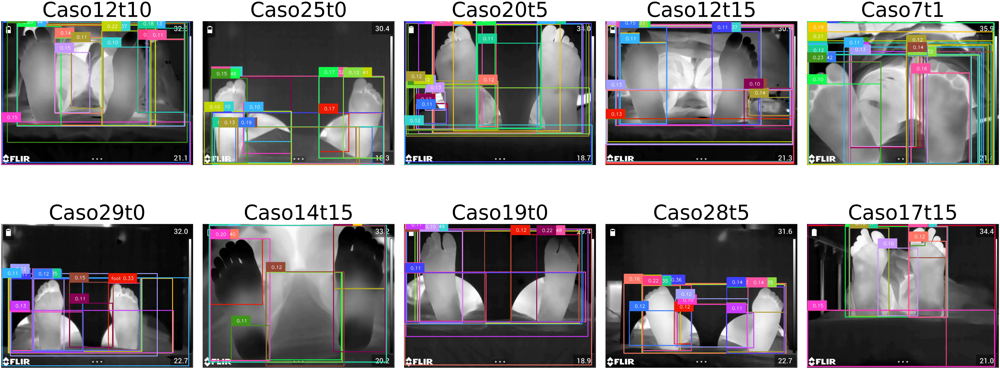

In [6]:
plot_grid(np.asarray(images),idss,boxess_wop,logitss_wop,phrasess_wop)

# With Post-Proccesing

In [5]:
boxes_wp, logits_wp, phrases_wp = model.predict_dino_batch(images=images,
                                                     text_prompt="feet . foot . soles",
                                                     box_threshold=0.10,
                                                     text_threshold=0.30,
                                                     box_process_threshold=0.10,    
                                                     postproccesingv2=True)

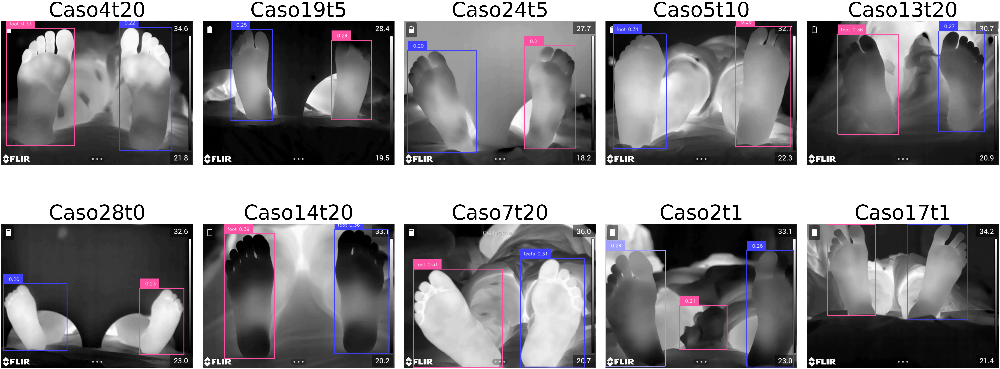

In [6]:
plot_grid(np.asarray(images),idss,boxes_wp,logits_wp,phrases_wp)

# SAM1

In [7]:
masks = model.predict_SAM1_batch(images,area_thresh=700,boxes=boxes_wp)
masks = [torch.Tensor(mask) for mask in masks]

In [8]:
data = {"Images": images,
        "Original": mask_original,
        "Prediction": masks,
        "ids":idss}

In [9]:
metricas, promedio = Metrics.calculate_average_mask_metrics(data)

jaccard Promedio = 0.8988928237652525
dice Promedio = 0.9379070957607412
sensitivity Promedio = 0.9459053239923843
specificity Promedio = 0.9825491676939294


In [10]:
promedio

,jaccard,dice,sensitivity,specificity
0,0.898893,0.937907,0.945905,0.982549


# SAM2

In [11]:
model2 = GSamNetwork(SAM="SAM2",SAM_MODEL="sam2_l")

Notice: Loading GroundDINO model
final text_encoder_type: bert-base-uncased
SAM2 selected: optimized for images and videos, offering improved object segmentation performance.
Notice: Loading the sam2_l model


In [12]:
from torchvision.ops import box_convert
H,W = images[0].shape[:2]
boxes_f = [box_convert(boxes * torch.Tensor([W, H, W, H]), in_fmt="cxcywh", out_fmt="xyxy") for boxes in boxes_wp]

In [13]:
masks = []
for image,box in zip(images,boxes_f):
  mask = model2.predict_SAM2(image=image,
                    box=box,
                    point_coords=None,
                    point_labels=None,
                    area_thresh=700)
  
  masks.append(torch.Tensor(mask))

In [14]:
data2 = {"Images": images,
        "Original": mask_original,
        "Prediction": masks,
        "ids":idss}

In [15]:
metricas, promedio = Metrics.calculate_average_mask_metrics(data2)

jaccard Promedio = 0.9050961906447056
dice Promedio = 0.9411301165819168
sensitivity Promedio = 0.933459016870945
specificity Promedio = 0.9879026625384676


In [16]:
promedio

,jaccard,dice,sensitivity,specificity
0,0.905096,0.94113,0.933459,0.987903
